### Step 1:Import all the libraries

In [1]:
### Import the required packages
import numpy as np
import pandas as pd
import seaborn as sns
%matplotlib inline
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

### Step 2:Load and Review the Data

In [2]:
df=pd.read_csv('cancer.csv')

In [3]:
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)

In [4]:
df.sample(10)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
398,904302,B,11.06,14.83,70.31,378.2,0.07741,0.04768,0.02712,0.007246,0.1535,0.06214,0.1855,0.6881,1.263,12.98,0.004259,0.014690,0.01940,0.004168,0.01191,0.003537,12.68,20.35,80.79,496.7,0.11200,0.1879,0.2079,0.05556,0.2590,0.09158,NaN
312,89382602,B,12.76,13.37,82.29,504.1,0.08794,0.07948,0.04052,0.025480,0.1601,0.06140,0.3265,0.6594,2.346,25.18,0.006494,0.027680,0.03137,0.010690,0.01731,0.004392,14.19,16.40,92.04,618.8,0.11940,0.2208,0.1769,0.08411,0.2564,0.08253,NaN
371,9012568,B,15.19,13.21,97.65,711.8,0.07963,0.06934,0.03393,0.026570,0.1721,0.05544,0.1783,0.4125,1.338,17.72,0.005012,0.014850,0.01551,0.009155,0.01647,0.001767,16.20,15.73,104.50,819.1,0.11260,0.1737,0.1362,0.08178,0.2487,0.06766,NaN
287,8913,B,12.89,13.12,81.89,515.9,0.06955,0.03729,0.02260,0.011710,0.1337,0.05581,0.1532,0.4690,1.115,12.68,0.004731,0.013450,0.01652,0.005905,0.01619,0.002081,13.62,15.54,87.40,577.0,0.09616,0.1147,0.1186,0.05366,0.2309,0.06915,NaN
363,9010872,B,16.50,18.29,106.60,838.1,0.09686,0.08468,0.05862,0.048350,0.1495,0.05593,0.3389,1.4390,2.344,33.58,0.007257,0.018050,0.01832,0.010330,0.01694,0.002001,18.13,25.45,117.20,1009.0,0.13380,0.1679,0.1663,0.09123,0.2394,0.06469,NaN
10,845636,M,16.02,23.24,102.70,797.8,0.08206,0.06669,0.03299,0.033230,0.1528,0.05697,0.3795,1.1870,2.466,40.51,0.004029,0.009269,0.01101,0.007591,0.01460,0.003042,19.19,33.88,123.80,1150.0,0.11810,0.1551,0.1459,0.09975,0.2948,0.08452,NaN
559,925291,B,11.51,23.93,74.52,403.5,0.09261,0.10210,0.11120,0.041050,0.1388,0.06570,0.2388,2.9040,1.936,16.97,0.008200,0.029820,0.05738,0.012670,0.01488,0.004738,12.48,37.16,82.28,474.2,0.12980,0.2517,0.3630,0.09653,0.2112,0.08732,NaN
301,892604,B,12.46,19.89,80.43,471.3,0.08451,0.10140,0.06830,0.030990,0.1781,0.06249,0.3642,1.0400,2.579,28.32,0.006530,0.033690,0.04712,0.014030,0.02740,0.004651,13.46,23.07,88.13,551.3,0.10500,0.2158,0.1904,0.07625,0.2685,0.07764,NaN
423,906878,B,13.66,19.13,89.46,575.3,0.09057,0.11470,0.09657,0.048120,0.1848,0.06181,0.2244,0.8950,1.804,19.36,0.003980,0.028090,0.03669,0.012740,0.01581,0.003956,15.14,25.50,101.40,708.8,0.11470,0.3167,0.3660,0.14070,0.2744,0.08839,NaN
488,913512,B,11.68,16.17,75.49,420.5,0.11280,0.09263,0.04279,0.031320,0.1853,0.06401,0.3713,1.1540,2.554,27.57,0.008998,0.012920,0.01851,0.011670,0.02152,0.003213,13.32,21.59,86.57,549.8,0.15260,0.1477,0.1490,0.09815,0.2804,0.08024,NaN


### Step 3:Explore the Data

In [5]:
df.shape

(569, 33)

In [6]:
df.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'Unnamed: 32'],
      dtype='object')

In [7]:
df.drop(["Unnamed: 32","id"],axis=1,inplace=True)

In [8]:
df.isnull().sum()

diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

C:\Users\Karthi\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='diagnosis', ylabel='count'>

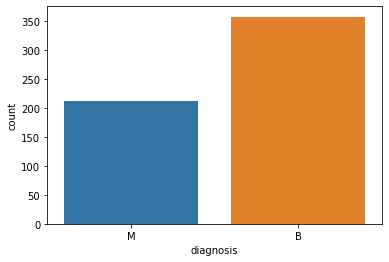

In [9]:
sns.countplot(df.diagnosis)

In [ ]:
# Upsampling since target variable is im balanced

In [10]:
df.diagnosis.value_counts()

B    357
M    212
Name: diagnosis, dtype: int64

In [11]:
357-212

145

In [12]:
df2=df[df.diagnosis=="M"].sample(145)
df2.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
343,M,19.68,21.68,129.9,1194.0,0.09797,0.1339,0.1863,0.11030,0.2082,0.05715,0.6226,2.284,5.173,67.66,0.004756,0.03368,0.04345,0.018060,0.03756,0.003288,22.75,34.66,157.6,1540.0,0.1218,0.3458,0.4734,0.2255,0.4045,0.07918
260,M,20.31,27.06,132.9,1288.0,0.10000,0.1088,0.1519,0.09333,0.1814,0.05572,0.3977,1.033,2.587,52.34,0.005043,0.01578,0.02117,0.008185,0.01282,0.001892,24.33,39.16,162.3,1844.0,0.1522,0.2945,0.3788,0.1697,0.3151,0.07999
78,M,20.18,23.97,143.7,1245.0,0.12860,0.3454,0.3754,0.16040,0.2906,0.08142,0.9317,1.885,8.649,116.40,0.010380,0.06835,0.10910,0.025930,0.07895,0.005987,23.37,31.72,170.3,1623.0,0.1639,0.6164,0.7681,0.2508,0.5440,0.09964
65,M,14.78,23.94,97.4,668.3,0.11720,0.1479,0.1267,0.09029,0.1953,0.06654,0.3577,1.281,2.450,35.24,0.006703,0.02310,0.02315,0.011840,0.01900,0.003224,17.31,33.39,114.6,925.1,0.1648,0.3416,0.3024,0.1614,0.3321,0.08911
562,M,15.22,30.62,103.4,716.9,0.10480,0.2087,0.2550,0.09429,0.2128,0.07152,0.2602,1.205,2.362,22.65,0.004625,0.04844,0.07359,0.016080,0.02137,0.006142,17.52,42.79,128.7,915.0,0.1417,0.7917,1.1700,0.2356,0.4089,0.14090


In [13]:
df1 = df.append(df2, ignore_index = True)
df1

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,perimeter_se,area_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,1.0950,0.9053,8.589,153.40,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,0.4956,1.1560,3.445,27.23,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,0.7572,0.7813,5.438,94.44,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
709,M,13.82,24.49,92.33,595.9,0.11620,0.16810,0.1357,0.06759,0.2275,0.07237,0.4751,1.5280,2.974,39.05,0.009680,0.03856,0.03476,0.01616,0.02434,0.006995,16.01,32.94,106.00,788.0,0.1794,0.3966,0.3381,0.1521,0.3651,0.11830
710,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.2439,0.13890,0.1726,0.05623,1.1760,1.2560,7.673,158.70,0.010300,0.02891,0.05198,0.02454,0.01114,0.004239,25.45,26.40,166.10,2027.0,0.1410,0.2113,0.4107,0.2216,0.2060,0.07115
711,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.3514,0.15200,0.2397,0.07016,0.7260,1.5950,5.772,86.22,0.006522,0.06158,0.07117,0.01664,0.02324,0.006185,25.74,39.42,184.60,1821.0,0.1650,0.8681,0.9387,0.2650,0.4087,0.12400
712,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,0.7456,0.7869,4.585,94.03,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758


C:\Users\Karthi\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='diagnosis', ylabel='count'>

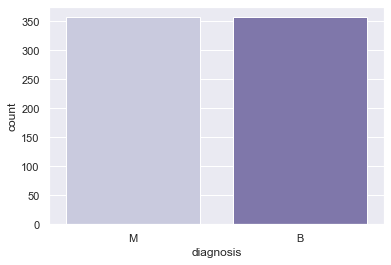

In [14]:
sns.set_style("darkgrid")
sns.set_context("notebook")
sns.countplot(df1.diagnosis,palette="Purples")

### Encoding

In [15]:
data_new=df1
data_new['diagnosis'] = [1 if each == "B" else 0 for each  in data_new.diagnosis]

<AxesSubplot:>

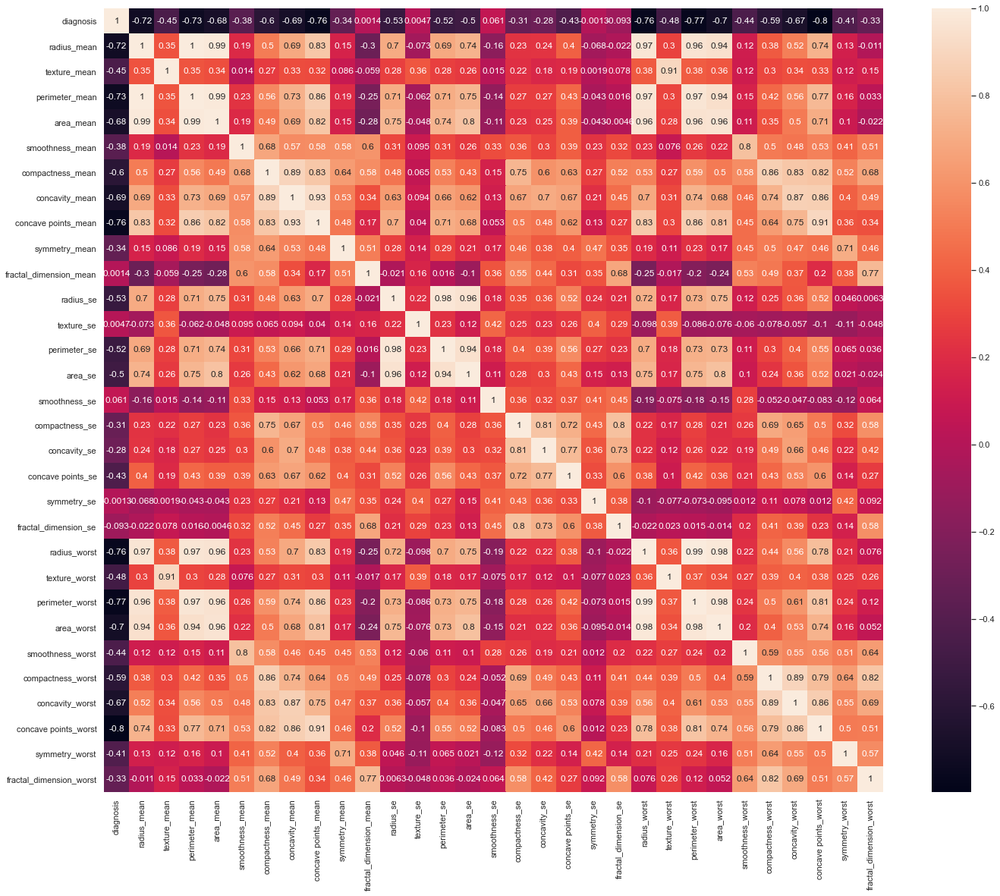

In [17]:
f, ax = plt.subplots(figsize=(23, 19))
sns.heatmap(data_new.corr(),annot=True)

<ipython-input-19-9029bc3646a9>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(17,1))


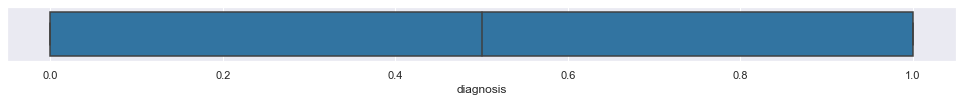

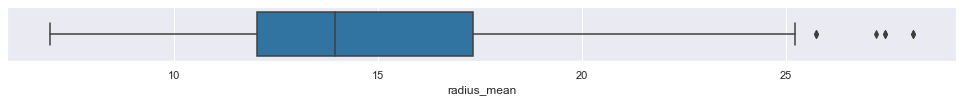

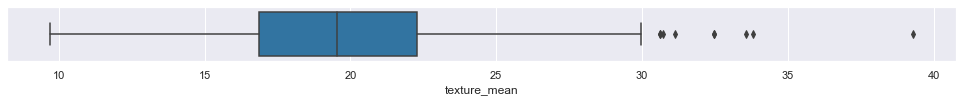

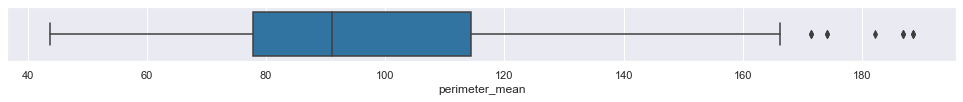

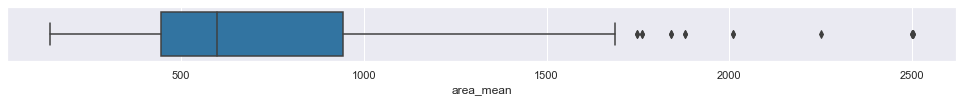

...

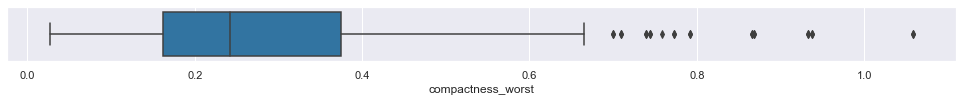

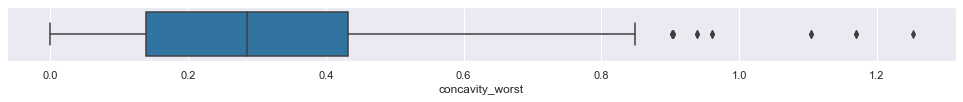

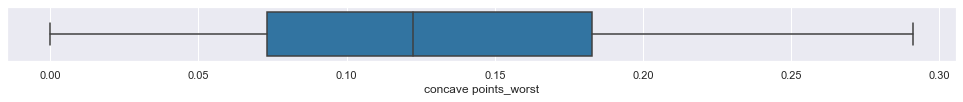

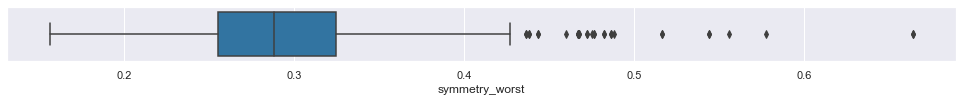

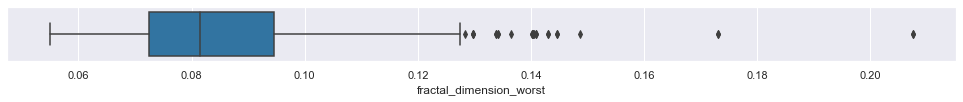

In [19]:
for column in data_new:
        plt.figure(figsize=(17,1))
        sns.boxplot(data=data_new, x=column)

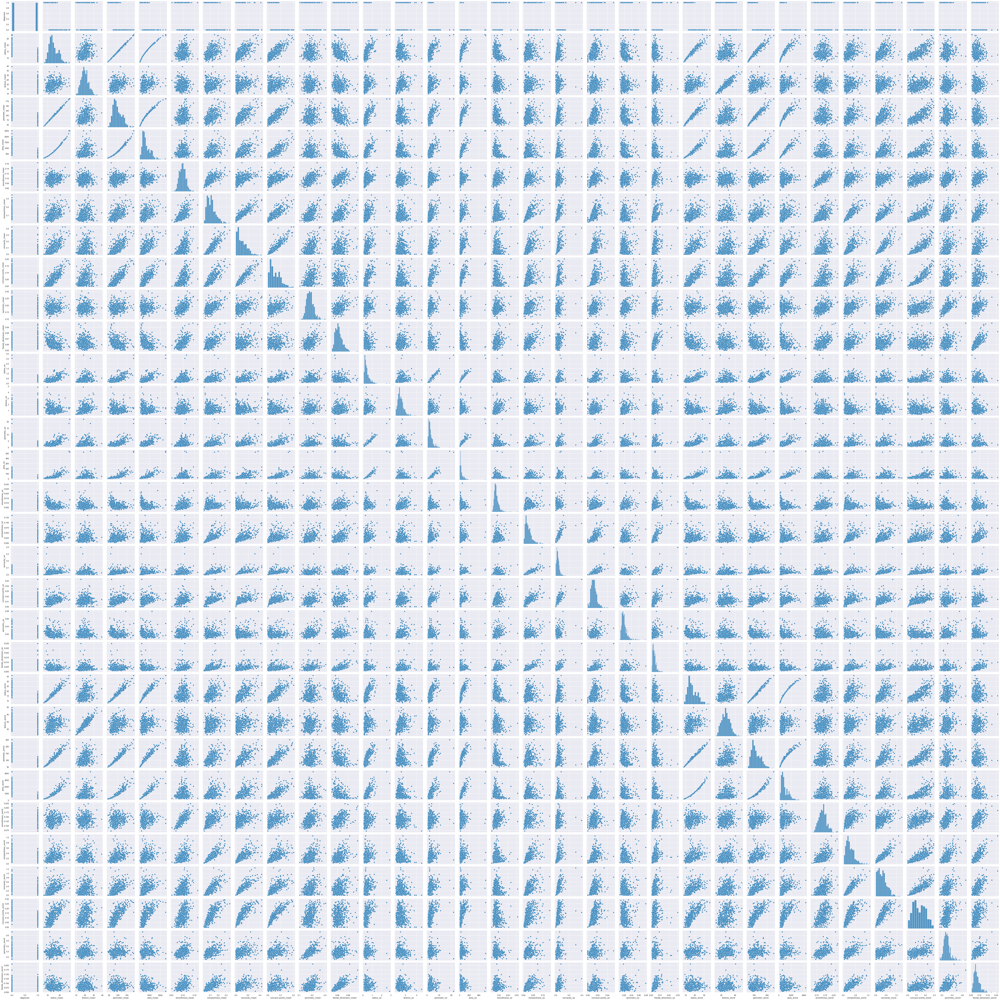

In [20]:
sns.pairplot(data_new)

### Step 4:Training Data and Testing Data Split

In [27]:
X=data_new.drop("diagnosis",axis=1)
y=data_new["diagnosis"]

In [28]:
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.25, random_state=0)

### Step 5: Fit the model with the Training Data

In [30]:
from sklearn.ensemble import BaggingClassifier

In [31]:
model0=BaggingClassifier(random_state=0)

In [32]:
model0.fit(X_train,y_train)

BaggingClassifier(random_state=0)

### Step 6:Predict the data

In [33]:
model0.score(X_train,y_train)

1.0

In [34]:
model0.score(X_test,y_test)

0.9608938547486033